In [13]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory


# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
TEST_PATH = '/kaggle/input/visual-taxonomy/test.csv'
TEST_IMAGE_PATH = '/kaggle/input/visual-taxonomy/test_images/'
TRAIN_PATH='/kaggle/input/visual-taxonomy/train.csv'
TEST_IMAGE_PATH = '/kaggle/input/visual-taxonomy/train_images/'
DESC_PATH="/kaggle/input/visual-taxonomy/category_attributes.parquet"

In [4]:
description=pd.read_parquet(DESC_PATH)
description.head()

,Category,No_of_attribute,Attribute_list
0,Men Tshirts,5,"[color, neck, pattern, print_or_pattern_type, ..."
1,Sarees,10,"[blouse_pattern, border, border_width, color, ..."
2,Kurtis,9,"[color, fit_shape, length, occasion, ornamenta..."
3,Women Tshirts,8,"[color, fit_shape, length, pattern, print_or_p..."
4,Women Tops & Tunics,10,"[color, fit_shape, length, neck_collar, ocassi..."


In [5]:
CATEGORIES = {
    'Men Tshirts': 5,
    'Sarees': 10,
    'Kurtis': 9,
    'Women Tshirts': 8,
    'Women Tops & Tunics': 10
}

In [6]:
for ind,row in description.iterrows():
    print(row.Category)
    print(row.Attribute_list,end="\n\n")


Men Tshirts
['color' 'neck' 'pattern' 'print_or_pattern_type' 'sleeve_length']

Sarees
['blouse_pattern' 'border' 'border_width' 'color' 'occasion'
 'ornamentation' 'pallu_details' 'pattern' 'print_or_pattern_type'
 'transparency']

Kurtis
['color' 'fit_shape' 'length' 'occasion' 'ornamentation' 'pattern'
 'print_or_pattern_type' 'sleeve_length' 'sleeve_styling']

Women Tshirts
['color' 'fit_shape' 'length' 'pattern' 'print_or_pattern_type'
 'sleeve_length' 'sleeve_styling' 'surface_styling']

Women Tops & Tunics
['color' 'fit_shape' 'length' 'neck_collar' 'ocassion' 'pattern'
 'print_or_pattern_type' 'sleeve_length' 'sleeve_styling'
 'surface_styling']



In [7]:
train_df=pd.read_csv(TRAIN_PATH)

In [8]:
train_df.head()

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
0,0,Men Tshirts,5,default,round,printed,default,short sleeves,NaN,NaN,NaN,NaN,NaN
1,1,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
2,2,Men Tshirts,5,default,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
3,3,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
4,4,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN


In [9]:
attr_columns=['attr_1', 'attr_2', 'attr_3', 'attr_4',
       'attr_5', 'attr_6', 'attr_7', 'attr_8', 'attr_9', 'attr_10']

In [11]:
for cat in CATEGORIES:
    df=train_df[train_df.Category==cat].copy()
    print(cat)
    df=df[attr_columns[:CATEGORIES[cat]]]
#     print(dict(df.isnull().sum()))
    print(df.shape)
    df=df.dropna()
    print(df.shape)
        

Men Tshirts
(7267, 5)
(4575, 5)
Sarees
(18346, 10)
(2237, 10)
Kurtis
(6822, 9)
(1465, 9)
Women Tshirts
(18774, 8)
(258, 8)
Women Tops & Tunics
(19004, 10)
(4070, 10)


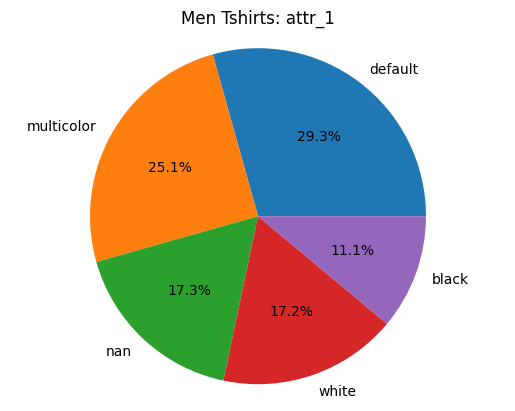

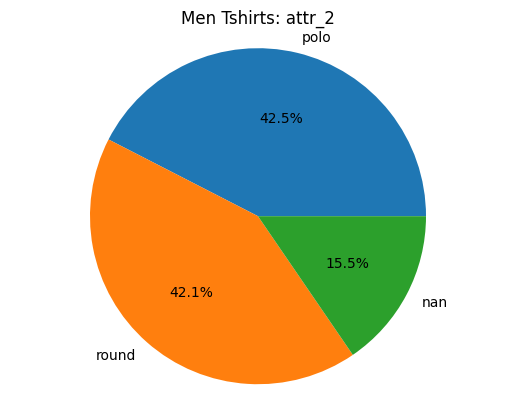

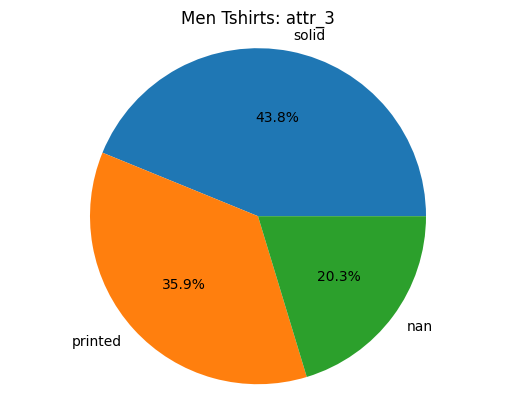

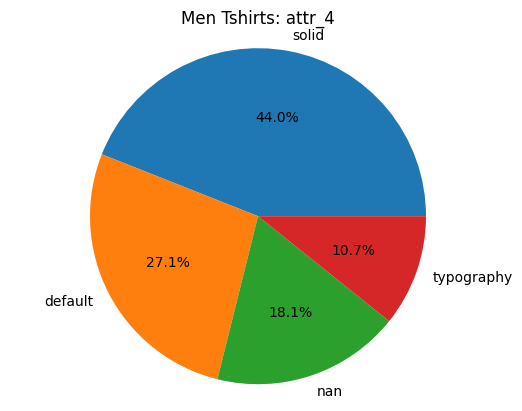

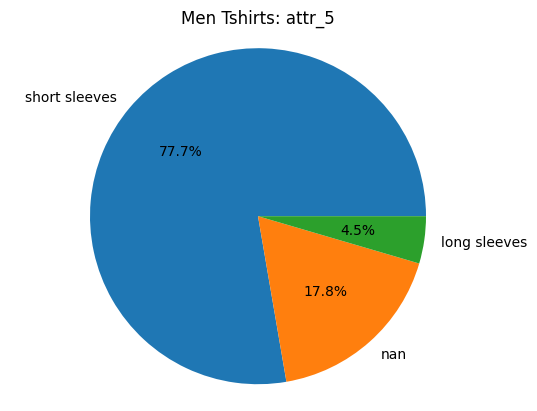

...

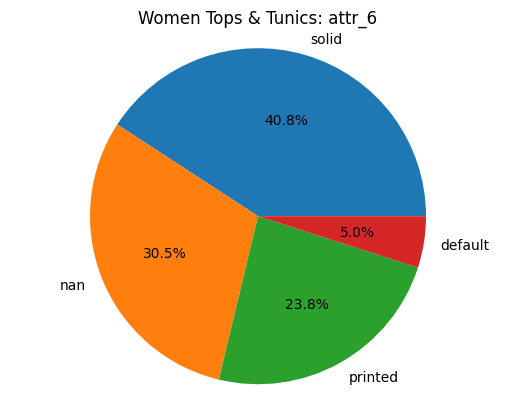

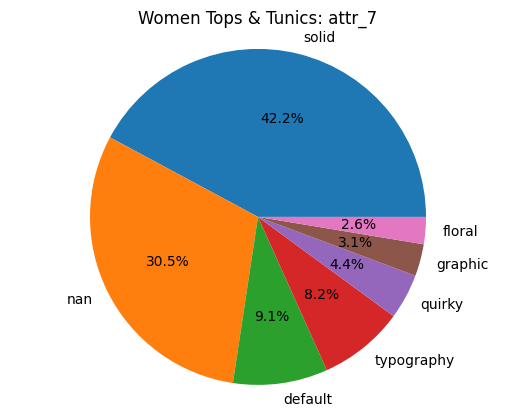

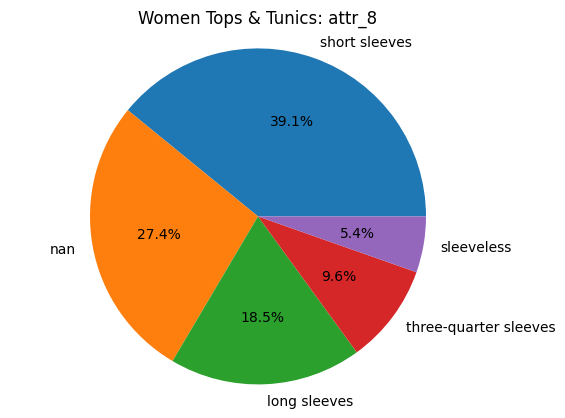

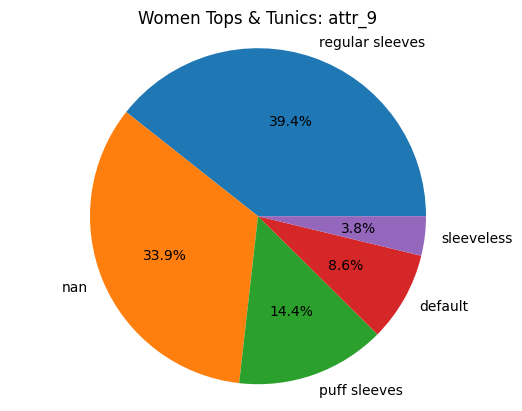

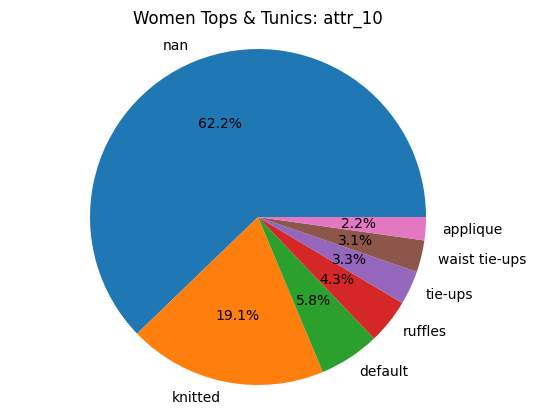

In [15]:
import matplotlib.pyplot as plt
for cat in CATEGORIES:
    df=train_df[train_df.Category==cat]
    for attr in attr_columns[:CATEGORIES[cat]]:
        value_counts=df[attr].value_counts(dropna=False)
        plt.pie(value_counts.values, labels=value_counts.index, autopct='%1.1f%%')
        plt.title(f"{cat}: {attr}")
        plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
        plt.show()

In [16]:
print(list(description.Attribute_list)[4])

['color' 'fit_shape' 'length' 'neck_collar' 'ocassion' 'pattern'
 'print_or_pattern_type' 'sleeve_length' 'sleeve_styling'
 'surface_styling']


In [17]:
attr_columns=['attr_1', 'attr_2', 'attr_3', 'attr_4',
       'attr_5', 'attr_6', 'attr_7', 'attr_8', 'attr_9', 'attr_10']
train=train_df
df=train[train[attr_columns].isnull().sum(axis=1)==9]
df=df[df["Category"]=="Sarees"]

/kaggle/input/visual-taxonomy/train_images/007564.jpg
        id Category  len attr_1 attr_2      attr_3 attr_4 attr_5 attr_6  \
7399  7564   Sarees   10    NaN    NaN  big border    NaN    NaN    NaN   

     attr_7 attr_8 attr_9 attr_10  
7399    NaN    NaN    NaN     NaN  


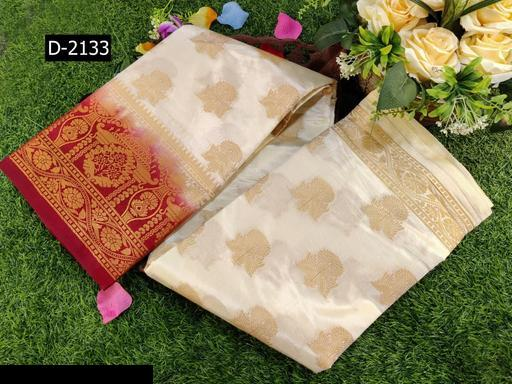

/kaggle/input/visual-taxonomy/train_images/007565.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4       attr_5 attr_6  \
7400  7565   Sarees   10    NaN    NaN    NaN    NaN  traditional    NaN   

     attr_7 attr_8 attr_9 attr_10  
7400    NaN    NaN    NaN     NaN  


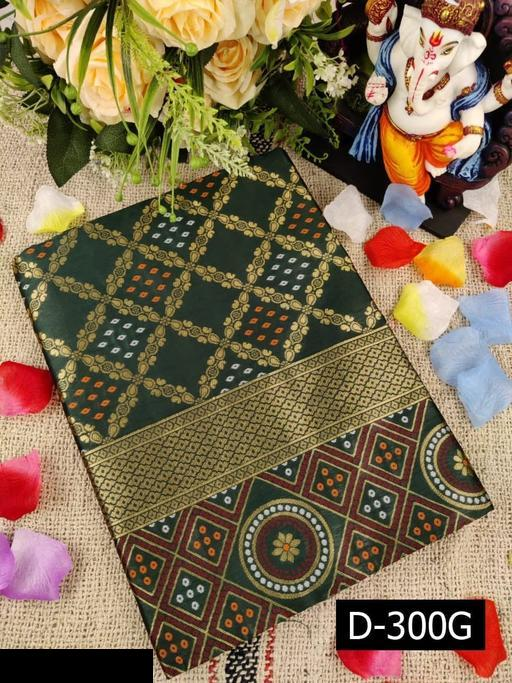

/kaggle/input/visual-taxonomy/train_images/007571.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4 attr_5   attr_6 attr_7  \
7406  7571   Sarees   10    NaN    NaN    NaN    NaN    NaN  default    NaN   

     attr_8 attr_9 attr_10  
7406    NaN    NaN     NaN  


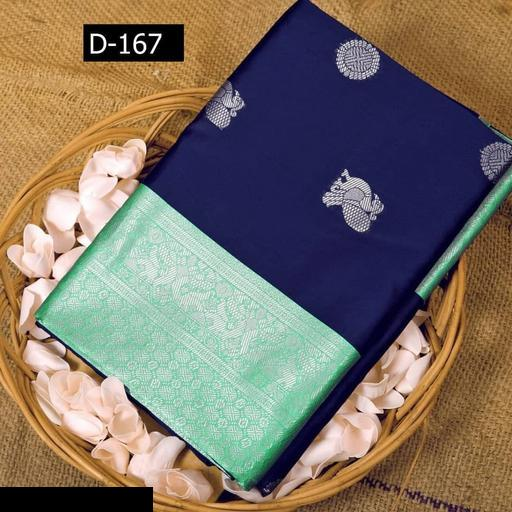

/kaggle/input/visual-taxonomy/train_images/007579.jpg
        id Category  len attr_1   attr_2 attr_3 attr_4 attr_5 attr_6 attr_7  \
7414  7579   Sarees   10    NaN  default    NaN    NaN    NaN    NaN    NaN   

     attr_8 attr_9 attr_10  
7414    NaN    NaN     NaN  


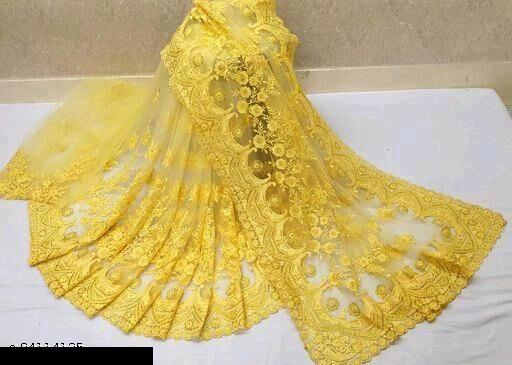

/kaggle/input/visual-taxonomy/train_images/007620.jpg
        id Category  len attr_1 attr_2      attr_3 attr_4 attr_5 attr_6  \
7455  7620   Sarees   10    NaN    NaN  big border    NaN    NaN    NaN   

     attr_7 attr_8 attr_9 attr_10  
7455    NaN    NaN    NaN     NaN  


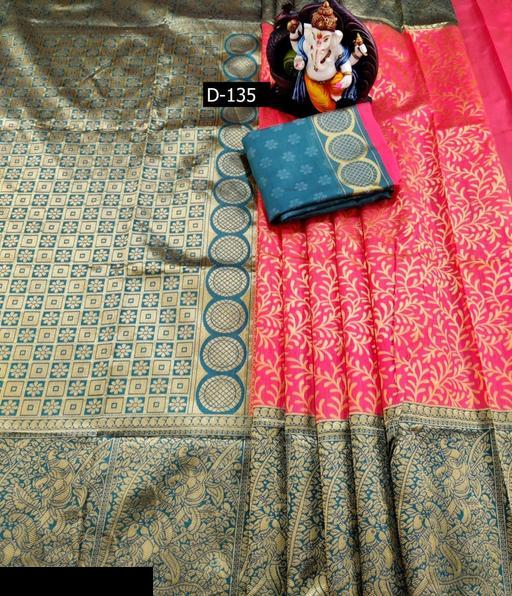

/kaggle/input/visual-taxonomy/train_images/007648.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4 attr_5 attr_6 attr_7  \
7483  7648   Sarees   10    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

     attr_8   attr_9 attr_10  
7483    NaN  peacock     NaN  


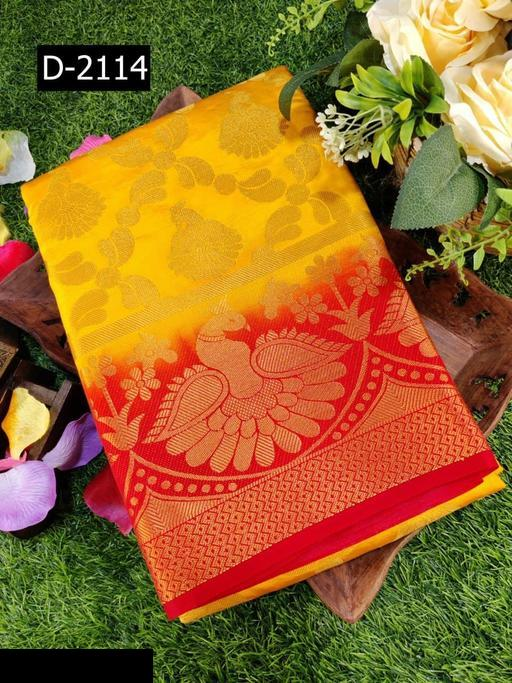

/kaggle/input/visual-taxonomy/train_images/007663.jpg
        id Category  len attr_1 attr_2 attr_3   attr_4 attr_5 attr_6 attr_7  \
7498  7663   Sarees   10    NaN    NaN    NaN  default    NaN    NaN    NaN   

     attr_8 attr_9 attr_10  
7498    NaN    NaN     NaN  


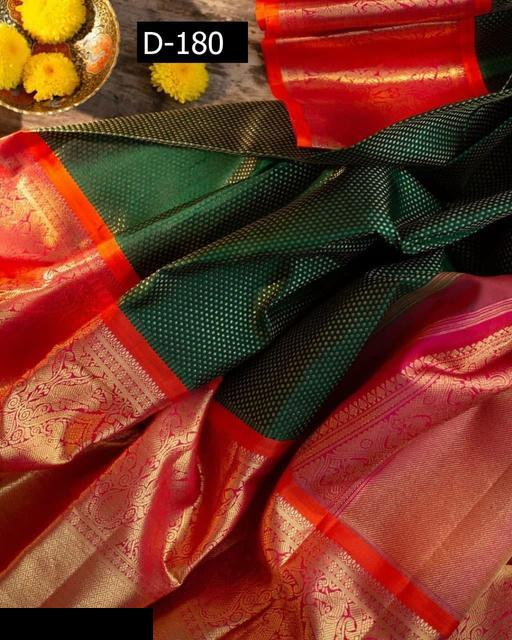

/kaggle/input/visual-taxonomy/train_images/007701.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4       attr_5 attr_6  \
7536  7701   Sarees   10    NaN    NaN    NaN    NaN  traditional    NaN   

     attr_7 attr_8 attr_9 attr_10  
7536    NaN    NaN    NaN     NaN  


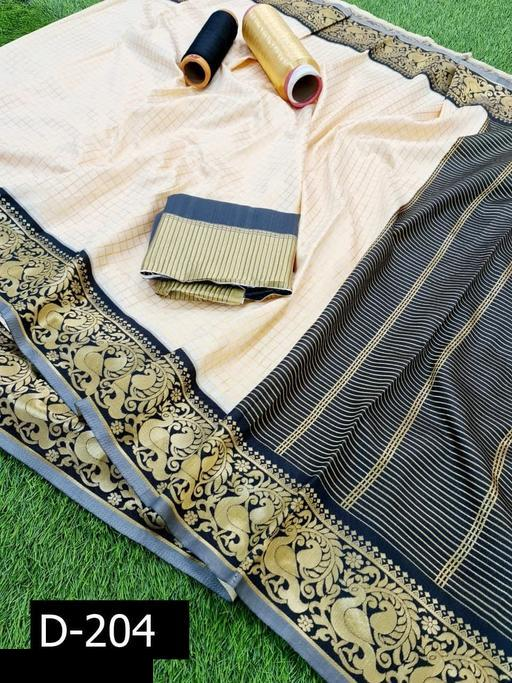

/kaggle/input/visual-taxonomy/train_images/007704.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4 attr_5    attr_6 attr_7  \
7539  7704   Sarees   10    NaN    NaN    NaN    NaN    NaN  jacquard    NaN   

     attr_8 attr_9 attr_10  
7539    NaN    NaN     NaN  


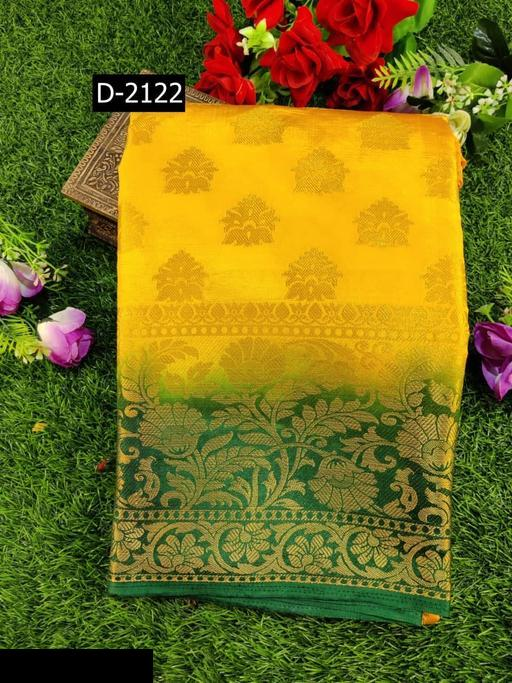

/kaggle/input/visual-taxonomy/train_images/007883.jpg
        id Category  len attr_1        attr_2 attr_3 attr_4 attr_5 attr_6  \
7718  7883   Sarees   10    NaN  woven design    NaN    NaN    NaN    NaN   

     attr_7 attr_8 attr_9 attr_10  
7718    NaN    NaN    NaN     NaN  


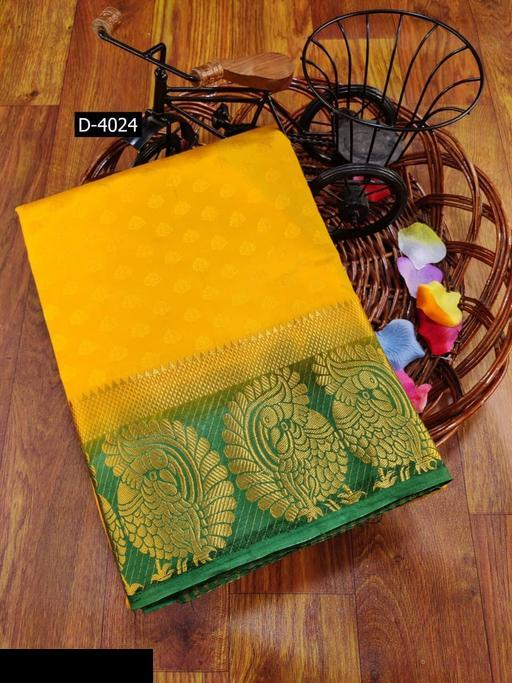

/kaggle/input/visual-taxonomy/train_images/008014.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4 attr_5 attr_6 attr_7  \
7849  8014   Sarees   10    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

     attr_8   attr_9 attr_10  
7849    NaN  default     NaN  


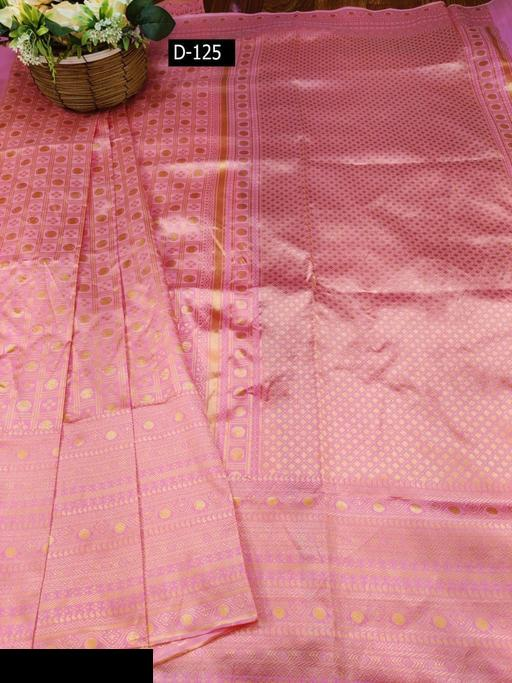

/kaggle/input/visual-taxonomy/train_images/008026.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4 attr_5 attr_6  \
7861  8026   Sarees   10    NaN    NaN    NaN    NaN    NaN    NaN   

             attr_7 attr_8 attr_9 attr_10  
7861  same as saree    NaN    NaN     NaN  


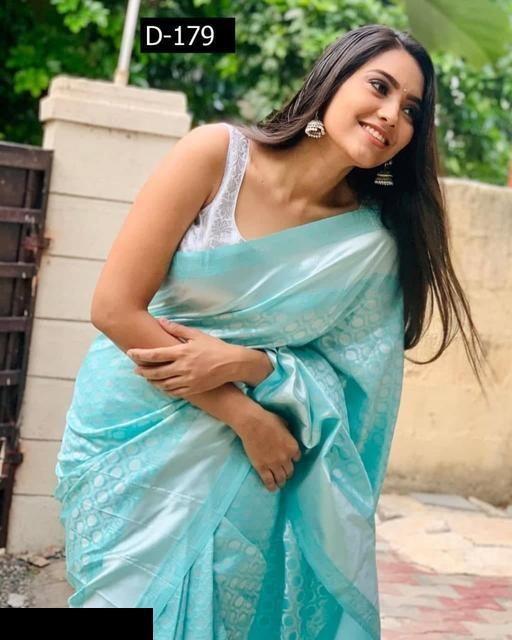

/kaggle/input/visual-taxonomy/train_images/008068.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4 attr_5 attr_6  \
7903  8068   Sarees   10    NaN    NaN    NaN    NaN    NaN    NaN   

          attr_7 attr_8 attr_9 attr_10  
7903  zari woven    NaN    NaN     NaN  


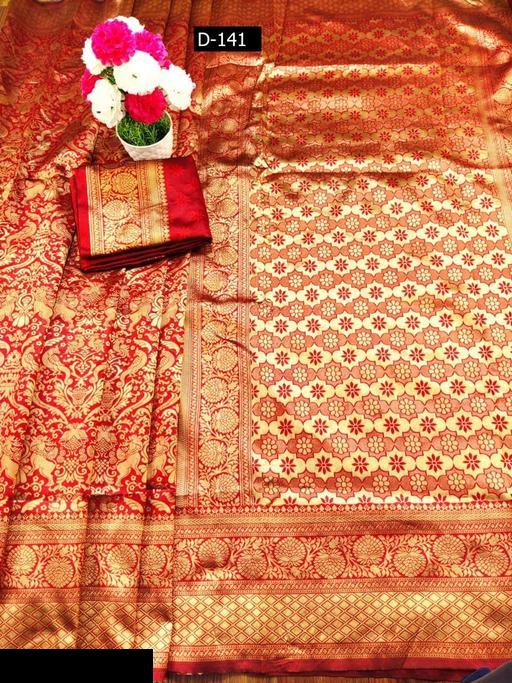

/kaggle/input/visual-taxonomy/train_images/008108.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4 attr_5 attr_6  \
7943  8108   Sarees   10    NaN    NaN    NaN    NaN    NaN    NaN   

             attr_7 attr_8 attr_9 attr_10  
7943  same as saree    NaN    NaN     NaN  


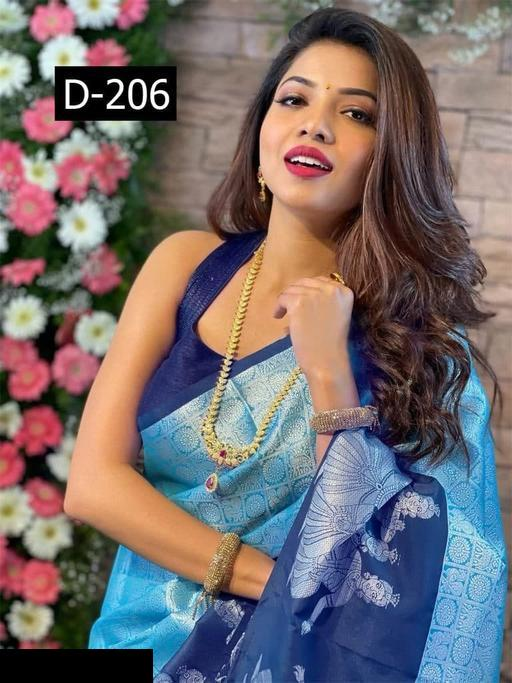

/kaggle/input/visual-taxonomy/train_images/008117.jpg
        id Category  len attr_1 attr_2 attr_3 attr_4 attr_5 attr_6 attr_7  \
7952  8117   Sarees   10    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

     attr_8   attr_9 attr_10  
7952    NaN  default     NaN  


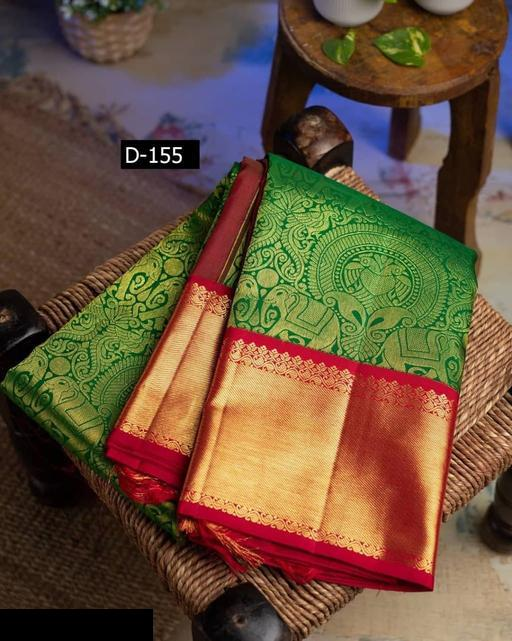

In [19]:
from PIL import Image
from IPython.display import display
for i in np.array((df["id"]))[0:15]:
    path=(TEST_IMAGE_PATH+"0"*(6-len(str(i)))+str(i)+".jpg")
    print(path)
    print(df[df.id==i])
    display(Image.open(path))